In [ ]:
# ==============================================================================
# Paquetes
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib.image import imread
import numpy as np
import os
import math
import cv2
import tensorflow as tf
import tensorflow_datasets as tfds
from google.colab import drive

Codigo para Generar el dataSet.

In [ ]:
def gerar_e_salvar_dataset(num_imagens, caminho_base):
    caminho_salvar = os.path.join(caminho_base, f'dataset_flores_{num_imagens}')
    os.makedirs(caminho_salvar, exist_ok=True)
    print(f"Pasta de destino configurada em: {caminho_salvar}")
    dataset, info = tfds.load(
        'tf_flowers',
        split='train',
        with_info=True,
        shuffle_files=True
    )
    dataset_subset = dataset.take(num_imagens)

    for i, exemplo in enumerate(dataset_subset):
        imagem_tensor = exemplo['image']
        imagem_np = np.array(imagem_tensor)
        imagem_redimensionada = cv2.resize(imagem_np, (360, 360), interpolation=cv2.INTER_AREA)
        imagem_bgr = cv2.cvtColor(imagem_redimensionada, cv2.COLOR_RGB2BGR)
        nome_arquivo = f'flor_{i+1}.jpg'
        caminho_completo = os.path.join(caminho_salvar, nome_arquivo)
        cv2.imwrite(caminho_completo, imagem_bgr)
if __name__ == "__main__":
    drive.mount('/content/drive')
    pasta_base = '/content/drive/MyDrive/datasets_gerados_flores'
    tamanhos_datasets = [25, 30, 50]
    for tamanho in tamanhos_datasets:
        gerar_e_salvar_dataset(num_imagens=tamanho, caminho_base=pasta_base)
#https://www.tensorflow.org/tutorials/load_data/images?hl=es-419

MessageError: Error: credential propagation was unsuccessful

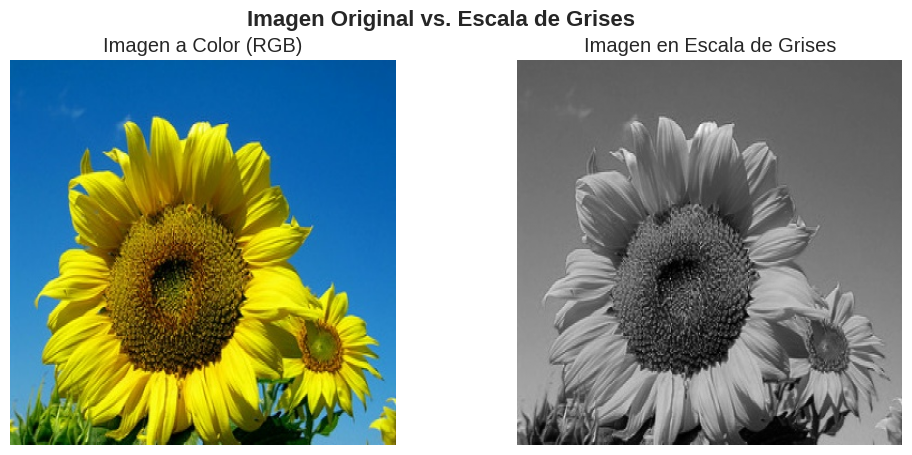

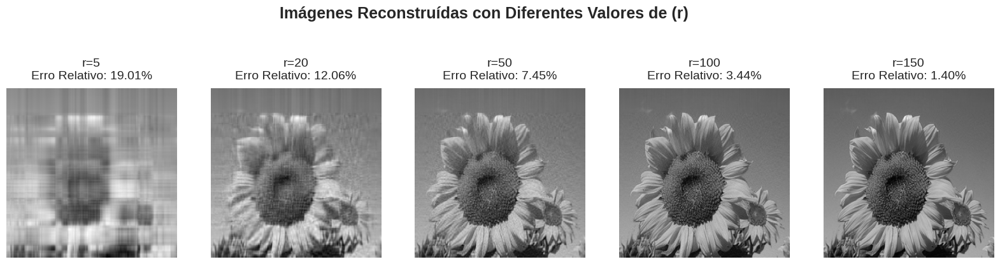

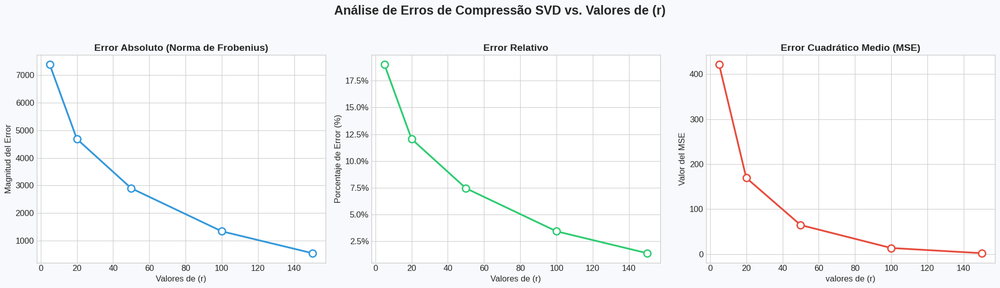

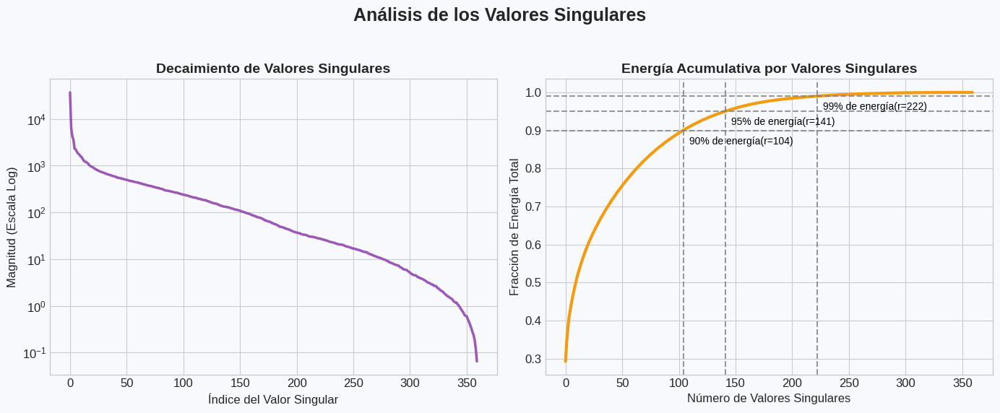

In [ ]:
# ==============================================================================
# ESTILO Y PALETA DE COLORES PARA LOS GRÁFICOS
# ==============================================================================
plt.style.use('seaborn-v0_8-whitegrid')
colors = {'blue': '#3498db', 'green': '#2ecc71', 'red': '#e74c3c',
          'purple': '#9b59b6', 'orange': '#f39c12', 'background': '#f7f9fc' }
plt.rcParams.update({'font.size': 12})
# ==============================================================================
# Subimos la imagen
# ==============================================================================
image_path="/content/drive/MyDrive/datasets_gerados_flores/dataset_flores_25/flor_17.jpg"
A = imread(image_path)
X = np.mean(A, -1) # Convertir a escala de grises
fig, axsreal = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Imagen Original vs. Escala de Grises', fontsize=16,
             fontweight='bold')
axsreal[0].imshow(A)
axsreal[0].set_title('Imagen a Color (RGB)')
axsreal[0].axis('off')
axsreal[1].imshow(X, cmap='gray')
axsreal[1].set_title('Imagen en Escala de Grises')
axsreal[1].axis('off')
plt.show()
# ==============================================================================
# Aplicacion de SVD
# ==============================================================================
U, S_vec, VT = np.linalg.svd(X, full_matrices=False)
S = np.diag(S_vec)
ranks = [5, 20, 50, 100, 150]
frobenius_errors = []
relative_errors = []
mse_errors = []
norm_X = np.linalg.norm(X, 'fro')
# ==============================================================================
# Visualización de las Imagenes
# ==============================================================================
fig, axs = plt.subplots(1, len(ranks), figsize=(20, 5))
fig.suptitle('Imágenes Reconstruídas con Diferentes Valores de (r)',fontsize=18,
             fontweight='bold', y=1.02)
for i, r in enumerate(ranks):
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    error_rel = np.linalg.norm(X - Xapprox, 'fro') / norm_X
    frobenius_errors.append(np.linalg.norm(X - Xapprox, 'fro'))
    relative_errors.append(error_rel)
    mse_errors.append(np.mean((X - Xapprox)**2))
    axs[i].imshow(Xapprox, cmap='gray')
    title_text = (f'r={r}\nErro Relativo: {error_rel:.2%}')
    axs[i].set_title(title_text, fontsize=14, pad=10)
    axs[i].axis('off')
plt.show()
# ==============================================================================
# Visualización de los Errores
# ==============================================================================
fig, axs_err = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Análise de Erros de Compressão SVD vs. Valores de (r)',
             fontsize=18, fontweight='bold')
fig.set_facecolor(colors['background'])
# Gráfico de Error Absoluto
axs_err[0].plot(ranks, frobenius_errors, 'o-', color=colors['blue'],
                markersize=10, linewidth=2.5, mfc='white', mew=2)
axs_err[0].set_title('Error Absoluto (Norma de Frobenius)', fontsize=14,
                     fontweight='bold')
axs_err[0].set_xlabel('Valores de (r)', fontsize=12)
axs_err[0].set_ylabel('Magnitud del Error', fontsize=12)
# Gráfico de Error Relativo
axs_err[1].plot(ranks, relative_errors, 'o-', color=colors['green'],
                markersize=10, linewidth=2.5, mfc='white', mew=2)
axs_err[1].set_title('Error Relativo', fontsize=14, fontweight='bold')
axs_err[1].set_xlabel('Valores de (r)', fontsize=12)
axs_err[1].set_ylabel('Porcentaje de Error (%)', fontsize=12)
axs_err[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.1%}'))
# Gráfico de MSE
axs_err[2].plot(ranks, mse_errors, 'o-', color=colors['red'], markersize=10,
                linewidth=2.5, mfc='white', mew=2)
axs_err[2].set_title('Error Cuadrático Medio (MSE)',fontsize=14,fontweight='bold')
axs_err[2].set_xlabel('valores de (r)', fontsize=12)
axs_err[2].set_ylabel('Valor del MSE', fontsize=12)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
# ==============================================================================
# Análisis de los Valores Singulares
# ==============================================================================
fig, axs_sin = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Análisis de los Valores Singulares',fontsize=18,fontweight='bold')
fig.set_facecolor(colors['background'])
# Gráfico de la magnitud de los valores singulares (escala logarítmica)
axs_sin[0].semilogy(S_vec, color=colors['purple'], linewidth=2.5)
axs_sin[0].set_title('Decaimiento de Valores Singulares', fontsize=14,
                     fontweight='bold')
axs_sin[0].set_xlabel('Índice del Valor Singular', fontsize=12)
axs_sin[0].set_ylabel('Magnitud (Escala Log)', fontsize=12)
axs_sin[0].set_facecolor(colors['background'])
# Gráfico de energía acumulativa
cumulative_energy = np.cumsum(S_vec) / np.sum(S_vec)
axs_sin[1].plot(cumulative_energy, color=colors['orange'], linewidth=3)
axs_sin[1].set_title('Energía Acumulativa por Valores Singulares', fontsize=14,
                     fontweight='bold')
axs_sin[1].set_xlabel('Número de Valores Singulares', fontsize=12)
axs_sin[1].set_ylabel('Fracción de Energía Total', fontsize=12)
axs_sin[1].set_facecolor(colors['background'])
# Marcar cuántos valores se necesitan para el 90% y 95% de la energía
for percentage in [0.90, 0.95, 0.99]:
    idx = np.where(cumulative_energy >= percentage)[0][0]
    axs_sin[1].axhline(y=percentage, linestyle='--', color='gray', alpha=0.8)
    axs_sin[1].axvline(x=idx, linestyle='--', color='gray', alpha=0.8)
    axs_sin[1].text(idx+5,percentage-0.036,f'{percentage:.0%} de energía(r={idx})',
                    fontsize=10, color='black')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [ ]:
U.shape, S_vec.shape, VT.shape

((360, 360), (360,), (360, 360))

In [ ]:
S[:10], S[-10:]

(array([[37093.40644216,     0.        ,     0.        , ...,
             0.        ,     0.        ,     0.        ],
        [    0.        ,  6545.21679612,     0.        , ...,
             0.        ,     0.        ,     0.        ],
        [    0.        ,     0.        ,  4274.98577316, ...,
             0.        ,     0.        ,     0.        ],
        ...,
        [    0.        ,     0.        ,     0.        , ...,
             0.        ,     0.        ,     0.        ],
        [    0.        ,     0.        ,     0.        , ...,
             0.        ,     0.        ,     0.        ],
        [    0.        ,     0.        ,     0.        , ...,
             0.        ,     0.        ,     0.        ]]),
 array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,

Para 25 imagenes

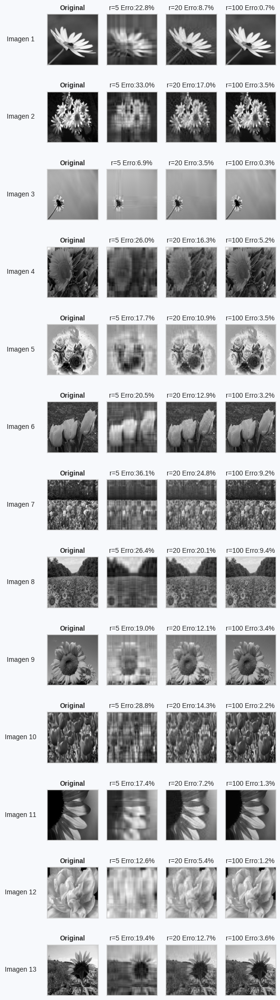

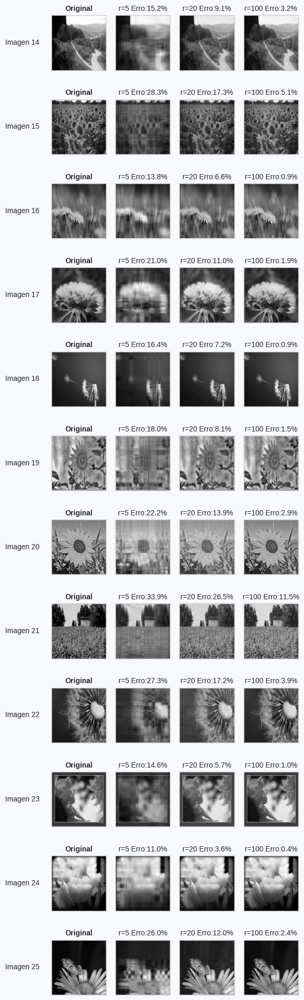

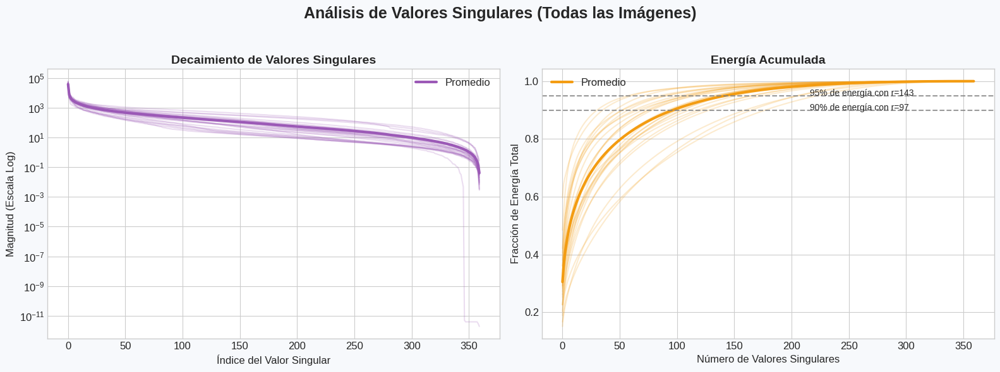

In [ ]:
# ==============================================================================
# ESTILO Y PALETA DE COLORES
# ==============================================================================
plt.style.use('seaborn-v0_8-whitegrid')
colors = {
    'blue': '#3498db', 'green': '#2ecc71', 'red': '#e74c3c',
    'purple': '#9b59b6', 'orange': '#f39c12', 'background': '#f7f9fc'
}
plt.rcParams.update({'font.size': 12, 'figure.facecolor': colors['background']})
# ==============================================================================
# CARGA DE IMÁGENES
# ==============================================================================
dataset_path = '/content/drive/MyDrive/datasets_gerados_flores/dataset_flores_25'
image_files =sorted([f for f in os.listdir(dataset_path) if f.lower().endswith('.jpg')])
images = [imread(os.path.join(dataset_path, f)) for f in image_files]

# ==============================================================================
# APLICACIÓN DE SVD Y CÁLCULO DE ERRORES
# ==============================================================================
if images:
    ranks = [5, 20, 100]
    approximations = {r: [] for r in ranks}
    errors = {r: [] for r in ranks}
    for img_color in images:
        img_gray = np.mean(img_color, axis=-1)
        norm_gray = np.linalg.norm(img_gray, 'fro')
        U, S_vec, VT = np.linalg.svd(img_gray, full_matrices=False)
        S = np.diag(S_vec)
        for r in ranks:
            Xapprox = U[:, :r] @ S[0:r, :r] @ VT[:r, :]
            approximations[r].append(Xapprox)
            error_rel = np.linalg.norm(img_gray - Xapprox, 'fro') / norm_gray
            mse = np.mean((img_gray - Xapprox)**2)
            errors[r].append({'rel': error_rel, 'mse': mse})
# ==============================================================================
# 4. VISUALIZAÇÃO COMPARATIVA EM DUAS PARTES
# ==============================================================================
if images:
    num_filas_total = len(images)
    ponto_divisao = (num_filas_total + 1) // 2
    num_cols = 1 + len(ranks)
    figsize1 = (num_cols *1.5, ponto_divisao *1.7)
    fig1, axes1 = plt.subplots(ponto_divisao, num_cols, figsize=figsize1)
    # Bloco 1 de imagens
    for i in range(ponto_divisao):
        axes1[i,0].imshow(np.mean(images[i], axis=-1), cmap='gray')
        axes1[i,0].set_title('Original', fontsize=10, fontweight='bold')
        axes1[i,0].set_ylabel(f'Imagen {i+1}',rotation=0,fontsize=10,labelpad=40
                              ,va='center')
        for j, r in enumerate(ranks):
            ax_approx = axes1[i, j + 1]
            approx_img = approximations[r][i]
            error_info = errors[r][i]
            ax_approx.imshow(approx_img, cmap='gray')
            ax_approx.set_title(f'r={r} Erro:{error_info["rel"]:.1%}',fontsize=10)
    for ax in axes1.flat:
        ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    # Bloco 2 de imagens
    num_filas_fig2 = num_filas_total - ponto_divisao
    if num_filas_fig2 > 0:
        figsize2 = (num_cols * 1.5, num_filas_fig2 * 1.7)
        fig2,axes2=plt.subplots(num_filas_fig2,num_cols,figsize=figsize2,squeeze=False)
        for i in range(ponto_divisao, num_filas_total):
            idx_fig2 = i - ponto_divisao
            axes2[idx_fig2, 0].imshow(np.mean(images[i], axis=-1), cmap='gray')
            axes2[idx_fig2, 0].set_title('Original', fontsize=10, fontweight='bold')
            axes2[idx_fig2, 0].set_ylabel(f'Imagen {i+1}', rotation=0,fontsize=10, labelpad=40, va='center')
            for j, r in enumerate(ranks):
                ax_approx = axes2[idx_fig2, j + 1]
                approx_img = approximations[r][i]
                error_info = errors[r][i]
                ax_approx.imshow(approx_img, cmap='gray')
                ax_approx.set_title(f'r={r} Erro:{error_info["rel"]:.1%}', fontsize=10)
        for ax in axes2.flat:
            ax.set_xticks([]); ax.set_yticks([])
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
# ==============================================================================
# 5. ANÁLISIS AGREGADO DE VALORES SINGULARES
# ==============================================================================
if images:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('Análisis de Valores Singulares (Todas las Imágenes)',
                 fontsize=18, fontweight='bold')
    all_s_vecs = []
    all_energies = []
    for img_color in images:
        img_gray = np.mean(img_color, axis=-1)
        _, s_vec, _ = np.linalg.svd(img_gray, full_matrices=False)
        all_s_vecs.append(s_vec)
        all_energies.append(np.cumsum(s_vec) / np.sum(s_vec))
        ax1.semilogy(s_vec, color=colors['purple'], alpha=0.2)
        ax2.plot(all_energies[-1], color=colors['orange'], alpha=0.2)
    mean_s_vecs = np.mean(all_s_vecs, axis=0)
    mean_energy = np.mean(all_energies, axis=0)
    ax1.semilogy(mean_s_vecs, color=colors['purple'], linewidth=3, label='Promedio')
    ax2.plot(mean_energy, color=colors['orange'], linewidth=3, label='Promedio')
    ax1.set_title('Decaimiento de Valores Singulares', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Índice del Valor Singular')
    ax1.set_ylabel('Magnitud (Escala Log)')
    ax1.legend()
    ax2.set_title('Energía Acumulada', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Número de Valores Singulares')
    ax2.set_ylabel('Fracción de Energía Total')
    ax2.legend()
    for percentage in [0.90, 0.95]:
        idx = np.where(mean_energy >= percentage)[0][0]
        ax2.axhline(y=percentage, linestyle='--', color='gray', alpha=0.8)
        ax2.text(len(mean_energy)*0.6, percentage,
                 f'{percentage:.0%} de energía con r={idx}', fontsize=10)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

caso para 30 imagenes

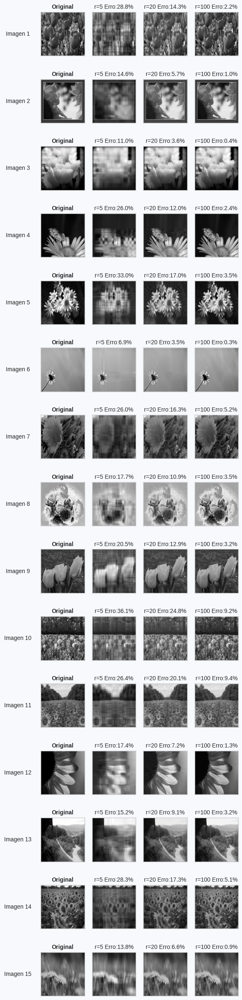

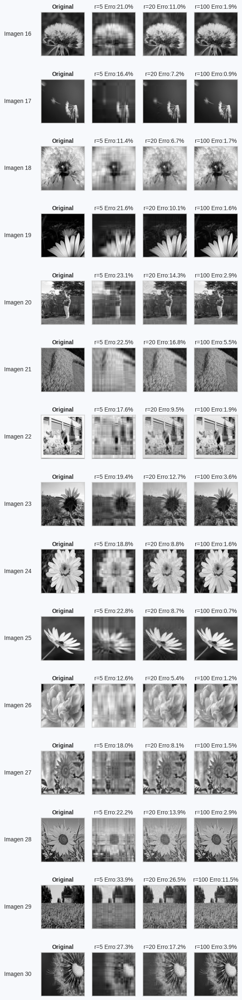

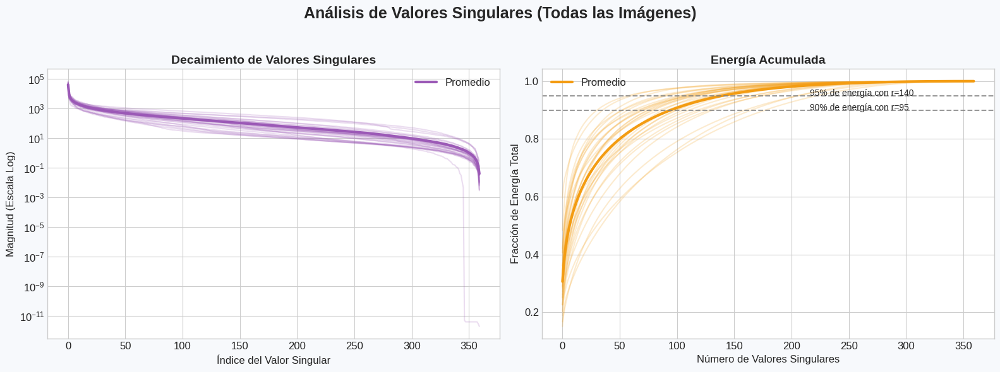

In [ ]:
# ==============================================================================
# ESTILO Y PALETA DE COLORES
# ==============================================================================
plt.style.use('seaborn-v0_8-whitegrid')
colors = {
    'blue': '#3498db', 'green': '#2ecc71', 'red': '#e74c3c',
    'purple': '#9b59b6', 'orange': '#f39c12', 'background': '#f7f9fc'
}
plt.rcParams.update({'font.size': 12, 'figure.facecolor': colors['background']})
# ==============================================================================
# CARGA DE IMÁGENES
# ==============================================================================
dataset_path = '/content/drive/MyDrive/datasets_gerados_flores/dataset_flores_30'
image_files =sorted([f for f in os.listdir(dataset_path) if f.lower().endswith('.jpg')])
images = [imread(os.path.join(dataset_path, f)) for f in image_files]
# ==============================================================================
# APLICACIÓN DE SVD Y CÁLCULO DE ERRORES
# ==============================================================================
if images:
    ranks = [5, 20, 100]
    approximations = {r: [] for r in ranks}
    errors = {r: [] for r in ranks}
    for img_color in images:
        img_gray = np.mean(img_color, axis=-1)
        norm_gray = np.linalg.norm(img_gray, 'fro')
        U, S_vec, VT = np.linalg.svd(img_gray, full_matrices=False)
        S = np.diag(S_vec)
        for r in ranks:
            Xapprox = U[:, :r] @ S[0:r, :r] @ VT[:r, :]
            approximations[r].append(Xapprox)
            error_rel = np.linalg.norm(img_gray - Xapprox, 'fro') / norm_gray
            mse = np.mean((img_gray - Xapprox)**2)
            errors[r].append({'rel': error_rel, 'mse': mse})
# ==============================================================================
# 4. VISUALIZAÇÃO COMPARATIVA EM DUAS PARTES
# ==============================================================================
if images:
    num_filas_total = len(images)
    ponto_divisao = (num_filas_total + 1) // 2
    num_cols = 1 + len(ranks)
    figsize1 = (num_cols *1.5, ponto_divisao *1.7)
    fig1, axes1 = plt.subplots(ponto_divisao, num_cols, figsize=figsize1)
    # Bloco 1 de imagens
    for i in range(ponto_divisao):
        axes1[i,0].imshow(np.mean(images[i], axis=-1), cmap='gray')
        axes1[i,0].set_title('Original', fontsize=10, fontweight='bold')
        axes1[i,0].set_ylabel(f'Imagen {i+1}',rotation=0,fontsize=10,labelpad=40
                              ,va='center')
        for j, r in enumerate(ranks):
            ax_approx = axes1[i, j + 1]
            approx_img = approximations[r][i]
            error_info = errors[r][i]
            ax_approx.imshow(approx_img, cmap='gray')
            ax_approx.set_title(f'r={r} Erro:{error_info["rel"]:.1%}',fontsize=10)
    for ax in axes1.flat:
        ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    # Bloco 2 de imagens
    num_filas_fig2 = num_filas_total - ponto_divisao
    if num_filas_fig2 > 0:
        figsize2 = (num_cols * 1.5, num_filas_fig2 * 1.7)
        fig2,axes2=plt.subplots(num_filas_fig2,num_cols,figsize=figsize2,squeeze=False)
        for i in range(ponto_divisao, num_filas_total):
            idx_fig2 = i - ponto_divisao
            axes2[idx_fig2, 0].imshow(np.mean(images[i], axis=-1), cmap='gray')
            axes2[idx_fig2, 0].set_title('Original', fontsize=10, fontweight='bold')
            axes2[idx_fig2, 0].set_ylabel(f'Imagen {i+1}', rotation=0,fontsize=10,
                                          labelpad=40, va='center')
            for j, r in enumerate(ranks):
                ax_approx = axes2[idx_fig2, j + 1]
                approx_img = approximations[r][i]
                error_info = errors[r][i]
                ax_approx.imshow(approx_img, cmap='gray')
                ax_approx.set_title(f'r={r} Erro:{error_info["rel"]:.1%}', fontsize=10)
        for ax in axes2.flat:
            ax.set_xticks([]); ax.set_yticks([])
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
# ==============================================================================
# 5. ANÁLISIS AGREGADO DE VALORES SINGULARES
# ==============================================================================
if images:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('Análisis de Valores Singulares (Todas las Imágenes)',
                 fontsize=18, fontweight='bold')
    all_s_vecs = []
    all_energies = []
    for img_color in images:
        img_gray = np.mean(img_color, axis=-1)
        _, s_vec, _ = np.linalg.svd(img_gray, full_matrices=False)
        all_s_vecs.append(s_vec)
        all_energies.append(np.cumsum(s_vec) / np.sum(s_vec))
        ax1.semilogy(s_vec, color=colors['purple'], alpha=0.2)
        ax2.plot(all_energies[-1], color=colors['orange'], alpha=0.2)
    mean_s_vecs = np.mean(all_s_vecs, axis=0)
    mean_energy = np.mean(all_energies, axis=0)
    ax1.semilogy(mean_s_vecs, color=colors['purple'], linewidth=3, label='Promedio')
    ax2.plot(mean_energy, color=colors['orange'], linewidth=3, label='Promedio')
    ax1.set_title('Decaimiento de Valores Singulares', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Índice del Valor Singular')
    ax1.set_ylabel('Magnitud (Escala Log)')
    ax1.legend()
    ax2.set_title('Energía Acumulada', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Número de Valores Singulares')
    ax2.set_ylabel('Fracción de Energía Total')
    ax2.legend()
    for percentage in [0.90, 0.95]:
        idx = np.where(mean_energy >= percentage)[0][0]
        ax2.axhline(y=percentage, linestyle='--', color='gray', alpha=0.8)
        ax2.text(len(mean_energy)*0.6, percentage,
                 f'{percentage:.0%} de energía con r={idx}', fontsize=10)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

Caso para 50 imagenes

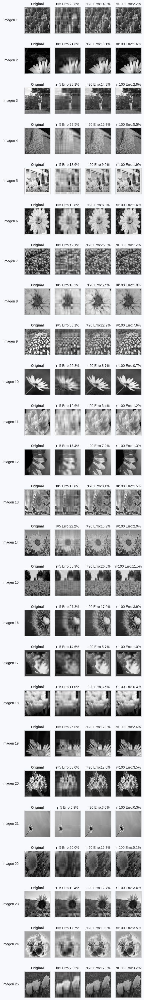

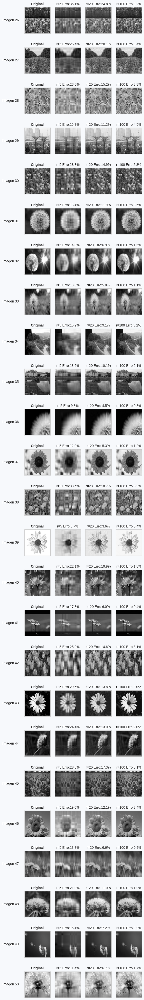

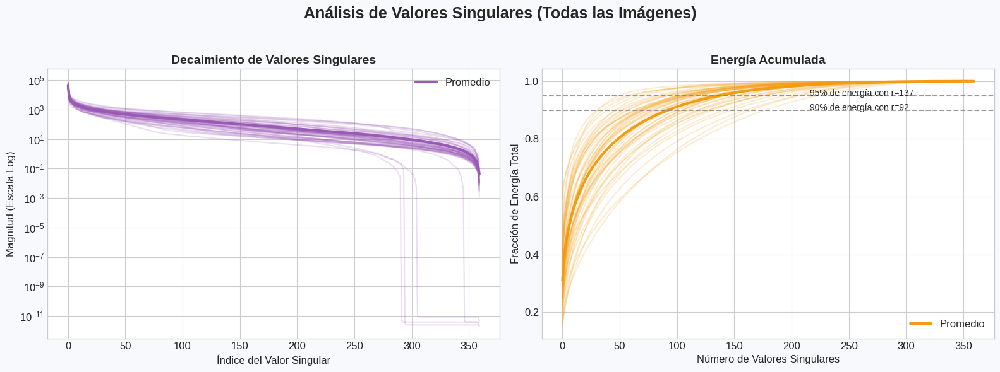

In [ ]:
# ==============================================================================
# ESTILO Y PALETA DE COLORES
# ==============================================================================
plt.style.use('seaborn-v0_8-whitegrid')
colors = {
    'blue': '#3498db', 'green': '#2ecc71', 'red': '#e74c3c',
    'purple': '#9b59b6', 'orange': '#f39c12', 'background': '#f7f9fc'
}
plt.rcParams.update({'font.size': 12, 'figure.facecolor': colors['background']})
# ==============================================================================
# CARGA DE IMÁGENES
# ==============================================================================
dataset_path = '/content/drive/MyDrive/datasets_gerados_flores/dataset_flores_50'
image_files =sorted([f for f in os.listdir(dataset_path) if f.lower().endswith('.jpg')])
images = [imread(os.path.join(dataset_path, f)) for f in image_files]
# ==============================================================================
# APLICACIÓN DE SVD Y CÁLCULO DE ERRORES
# ==============================================================================
if images:
    ranks = [5, 20, 100]
    approximations = {r: [] for r in ranks}
    errors = {r: [] for r in ranks}
    for img_color in images:
        img_gray = np.mean(img_color, axis=-1)
        norm_gray = np.linalg.norm(img_gray, 'fro')
        U, S_vec, VT = np.linalg.svd(img_gray, full_matrices=False)
        S = np.diag(S_vec)
        for r in ranks:
            Xapprox = U[:, :r] @ S[0:r, :r] @ VT[:r, :]
            approximations[r].append(Xapprox)
            error_rel = np.linalg.norm(img_gray - Xapprox, 'fro') / norm_gray
            mse = np.mean((img_gray - Xapprox)**2)
            errors[r].append({'rel': error_rel, 'mse': mse})
# ==============================================================================
# 4. VISUALIZAÇÃO COMPARATIVA EM DUAS PARTES
# ==============================================================================
if images:
    num_filas_total = len(images)
    ponto_divisao = (num_filas_total + 1) // 2
    num_cols = 1 + len(ranks)
    figsize1 = (num_cols *1.5, ponto_divisao *1.7)
    fig1, axes1 = plt.subplots(ponto_divisao, num_cols, figsize=figsize1)
    # Bloco 1 de imagens
    for i in range(ponto_divisao):
        axes1[i,0].imshow(np.mean(images[i], axis=-1), cmap='gray')
        axes1[i,0].set_title('Original', fontsize=10, fontweight='bold')
        axes1[i,0].set_ylabel(f'Imagen {i+1}',rotation=0,fontsize=10,labelpad=40
                              ,va='center')
        for j, r in enumerate(ranks):
            ax_approx = axes1[i, j + 1]
            approx_img = approximations[r][i]
            error_info = errors[r][i]
            ax_approx.imshow(approx_img, cmap='gray')
            ax_approx.set_title(f'r={r} Erro:{error_info["rel"]:.1%}',fontsize=10)
    for ax in axes1.flat:
        ax.set_xticks([]); ax.set_yticks([])
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    # Bloco 2 de imagens
    num_filas_fig2 = num_filas_total - ponto_divisao
    if num_filas_fig2 > 0:
        figsize2 = (num_cols * 1.5, num_filas_fig2 * 1.7)
        fig2,axes2=plt.subplots(num_filas_fig2,num_cols,figsize=figsize2,squeeze=False)
        for i in range(ponto_divisao, num_filas_total):
            idx_fig2 = i - ponto_divisao
            axes2[idx_fig2, 0].imshow(np.mean(images[i], axis=-1), cmap='gray')
            axes2[idx_fig2, 0].set_title('Original', fontsize=10, fontweight='bold')
            axes2[idx_fig2, 0].set_ylabel(f'Imagen {i+1}', rotation=0,fontsize=10, labelpad=40, va='center')
            for j, r in enumerate(ranks):
                ax_approx = axes2[idx_fig2, j + 1]
                approx_img = approximations[r][i]
                error_info = errors[r][i]
                ax_approx.imshow(approx_img, cmap='gray')
                ax_approx.set_title(f'r={r} Erro:{error_info["rel"]:.1%}', fontsize=10)
        for ax in axes2.flat:
            ax.set_xticks([]); ax.set_yticks([])
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
# ==============================================================================
# 5. ANÁLISIS AGREGADO DE VALORES SINGULARES
# ==============================================================================
if images:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('Análisis de Valores Singulares (Todas las Imágenes)',
                 fontsize=18, fontweight='bold')
    all_s_vecs = []
    all_energies = []
    for img_color in images:
        img_gray = np.mean(img_color, axis=-1)
        _, s_vec, _ = np.linalg.svd(img_gray, full_matrices=False)
        all_s_vecs.append(s_vec)
        all_energies.append(np.cumsum(s_vec) / np.sum(s_vec))
        ax1.semilogy(s_vec, color=colors['purple'], alpha=0.2)
        ax2.plot(all_energies[-1], color=colors['orange'], alpha=0.2)
    mean_s_vecs = np.mean(all_s_vecs, axis=0)
    mean_energy = np.mean(all_energies, axis=0)
    ax1.semilogy(mean_s_vecs, color=colors['purple'], linewidth=3, label='Promedio')
    ax2.plot(mean_energy, color=colors['orange'], linewidth=3, label='Promedio')
    ax1.set_title('Decaimiento de Valores Singulares', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Índice del Valor Singular')
    ax1.set_ylabel('Magnitud (Escala Log)')
    ax1.legend()
    ax2.set_title('Energía Acumulada', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Número de Valores Singulares')
    ax2.set_ylabel('Fracción de Energía Total')
    ax2.legend()
    for percentage in [0.90, 0.95]:
        idx = np.where(mean_energy >= percentage)[0][0]
        ax2.axhline(y=percentage, linestyle='--', color='gray', alpha=0.8)
        ax2.text(len(mean_energy)*0.6, percentage,
                 f'{percentage:.0%} de energía con r={idx}', fontsize=10)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()